# <strong><span>Predicting Career Outcomes of NBA Players</span></strong>  
### Terry Pham
### PSTAT 131 (Statistical Machine Learning) - Summer 2023

---------------------------------------------------------------------------------------------------------------------------------------

<img src="https://library.sportingnews.com/styles/crop_style_16_9_desktop_webp/s3/2021-08/nba-logo-ftr_hdo0fhdqzf831kmvypizccxeg.jpg.webp?itok=1uSdN3YA" alt="Alternative text" />

# Table of Contents

  - Introduction

  - Data Tidying

  - Exploratory Data Analysis (EDA)

  - Model Building and Selection

  - Testing Out Selected Models

  - Putting Selected Models to Use

  - Conclusion

# Introduction

Given information on a player's statistics in past NBA seasons, I am intereseted in predicting what level of success they will reach in there careers. Will they be an All-Star in the future? Will they get an All NBA Selection? Or will they just be a roster player? The objective is to build a machine learning model that will be able to do this. 

The data that I am working with for this project is from the National Basketball Association (NBA) which includes player statistics such as draft information, award information, and game information from 1947 to 2023. For this project, I am working with different datasets will be aggregated together with the largest dataset consisting of about 31,000 observations and as much as 35 columns. The variables of interest for this project will be the in-game player statistics such as points per game and win share, along with player awards like all-star selection and MVP. However, for the purpose of this project the data will be subsetting to a time frame only as far back as 1980 and additionally, I'll be working with players whose first years in the NBA are at latest up to the 2018 season. The datasets can be found on Kaggle <a href="https://www.kaggle.com/datasets/sumitrodatta/nba-aba-baa-stats?resource=download&select=Advanced.csv">here.</a>

In this project, I'll first be creating a new categorical variable called `Career Outcome` which is the highest achievement level that a player has reached in their career after their first four seasons in the league, which will consist of 5 categories: Elite, All-Star, Starter, Roster, and Out of League.

- Elite: Any player who has had an All NBA 1st or 2nd team Section or has won Most Valuable Player or Defensive Player of the Year

- All-Star: Any player who has been an All Star

- Starter: Any player who has played at least 50 games or 2000 minutes in a season

- Roster: Any player who is on an NBA team that season

- Out of League: Any player who is not in the NBA that season

The overall goal of this project is to utilize other predictors to predict this new categorical variable, which will be best done through a classification approach. Then I will apply the best machine learning model to predict the career outcomes of the most recently drafted players in the NBA.

This project could prove useful in many cases as for example, NBA teams could utilize the career outcome predictions of newer players when making trade decisions or contract offerings. Another example could help NBA analysts use these player career outcome predictions to make insights on how certain teams would perform in the future.

# Data Tidying

First we will load the necessary packages along with the raw data sets of interest.

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import seaborn as sns

advanced = pd.read_csv('../data/Advanced.csv')

# Subsetting the data so that we are only looking at players in the NBA
advanced = advanced[advanced['lg'] == 'NBA'].copy()

# Dropping unnecessary columns such as birth_year
advanced = advanced.drop(columns = 'birth_year')

advanced.head(5)

,seas_id,season,player_id,player,pos,age,experience,lg,tm,g,...,tov_percent,usg_percent,ows,dws,ws,ws_48,obpm,dbpm,bpm,vorp
0,30458,2023,5025,A.J. Green,SG,23.0,1,NBA,MIL,35,...,6.6,16.6,0.5,0.3,0.8,0.111,-0.3,-0.6,-0.9,0.1
1,30459,2023,5026,A.J. Lawson,SG,22.0,1,NBA,TOT,15,...,5.9,21.1,0.1,0.1,0.1,0.063,-1.5,-2.9,-4.4,-0.1
2,30460,2023,5026,A.J. Lawson,SG,22.0,1,NBA,MIN,1,...,0.0,21.4,0.0,0.0,0.0,0.377,-2.3,7.5,5.2,0.0
3,30461,2023,5026,A.J. Lawson,SG,22.0,1,NBA,DAL,14,...,6.1,21.1,0.1,0.1,0.1,0.057,-1.5,-3.1,-4.6,-0.1
4,30462,2023,4219,Aaron Gordon,PF,27.0,9,NBA,DEN,68,...,9.8,21.1,4.6,2.2,6.8,0.158,2.4,-0.3,2.1,2.1


This is the "advanced.csv" data set which has been subsetted to have only NBA data as that is the league that we are interested in and the `birth_year` column has been dropped.

Next I am loading another raw data set called "Player Season Info.csv" and will create a new column called `First Year in NBA` which contains the first season every player has played in the NBA and merge this dataset with the subsetted advanced data set.

In [10]:
# Creating a new column called First Year in NBA for all players
# from Player Season Info dataframe
player_season_info = pd.read_csv('../data/Player Season Info.csv')

player_first_year = player_season_info[player_season_info['experience'] == 1].copy()
player_first_year = player_first_year[player_first_year['lg'] == 'NBA'].copy()
player_first_year['First Year in NBA'] = player_first_year['season']
player_first_year = player_first_year.loc[:, ['player_id', 'First Year in NBA']].copy()

# Merging this dataset with advanced
advanced1 = pd.merge(advanced, player_first_year, on = 'player_id', how = 'left')

advanced1 = advanced1.drop_duplicates()

advanced1.head(5)

,seas_id,season,player_id,player,pos,age,experience,lg,tm,g,...,usg_percent,ows,dws,ws,ws_48,obpm,dbpm,bpm,vorp,First Year in NBA
0,30458,2023,5025,A.J. Green,SG,23.0,1,NBA,MIL,35,...,16.6,0.5,0.3,0.8,0.111,-0.3,-0.6,-0.9,0.1,2023.0
1,30459,2023,5026,A.J. Lawson,SG,22.0,1,NBA,TOT,15,...,21.1,0.1,0.1,0.1,0.063,-1.5,-2.9,-4.4,-0.1,2023.0
4,30460,2023,5026,A.J. Lawson,SG,22.0,1,NBA,MIN,1,...,21.4,0.0,0.0,0.0,0.377,-2.3,7.5,5.2,0.0,2023.0
7,30461,2023,5026,A.J. Lawson,SG,22.0,1,NBA,DAL,14,...,21.1,0.1,0.1,0.1,0.057,-1.5,-3.1,-4.6,-0.1,2023.0
10,30462,2023,4219,Aaron Gordon,PF,27.0,9,NBA,DEN,68,...,21.1,4.6,2.2,6.8,0.158,2.4,-0.3,2.1,2.1,2015.0


Next I am using the raw "All-Star Selections.csv" data set to create an indication column to indicates if a player has been selected as an All Star before and will merge that column to the advanced data set.

In [11]:
# Using All-Star Selections to create a new column that
# indicates if players have been selected as an all star

all_star = pd.read_csv('../data/All-Star Selections.csv')
all_star['All Star'] = True

advanced2 = pd.merge(advanced1, all_star.drop(columns = ['team', 'lg', 'season', 'replaced']), on = 'player', how = 'left')

# Fills in the NaN values with False
advanced2['All Star'] = advanced2['All Star'].fillna(False)
advanced2 = advanced2.drop_duplicates()
advanced2.head(5)

/var/folders/l7/s9sw54rj1yj8s9p81kpvxxpm0000gn/T/ipykernel_5825/3061720126.py:10: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  advanced2['All Star'] = advanced2['All Star'].fillna(False)


,seas_id,season,player_id,player,pos,age,experience,lg,tm,g,...,ows,dws,ws,ws_48,obpm,dbpm,bpm,vorp,First Year in NBA,All Star
0,30458,2023,5025,A.J. Green,SG,23.0,1,NBA,MIL,35,...,0.5,0.3,0.8,0.111,-0.3,-0.6,-0.9,0.1,2023.0,False
1,30459,2023,5026,A.J. Lawson,SG,22.0,1,NBA,TOT,15,...,0.1,0.1,0.1,0.063,-1.5,-2.9,-4.4,-0.1,2023.0,False
2,30460,2023,5026,A.J. Lawson,SG,22.0,1,NBA,MIN,1,...,0.0,0.0,0.0,0.377,-2.3,7.5,5.2,0.0,2023.0,False
3,30461,2023,5026,A.J. Lawson,SG,22.0,1,NBA,DAL,14,...,0.1,0.1,0.1,0.057,-1.5,-3.1,-4.6,-0.1,2023.0,False
4,30462,2023,4219,Aaron Gordon,PF,27.0,9,NBA,DEN,68,...,4.6,2.2,6.8,0.158,2.4,-0.3,2.1,2.1,2015.0,False


Doing same thing for players who have gotten an All NBA 1st or 2nd team selection.

In [13]:
# Using End of Season Teams.csv to create an indicator column for
# All NBA selected players for All NBA 1st and 2nd teams only

pd.set_option('future.no_silent_downcasting', True)

end_of_season = pd.read_csv('../data/End of Season Teams.csv')
end_of_season = end_of_season[end_of_season['lg'] == 'NBA'].copy()
all_nba = end_of_season[end_of_season['type'] == 'All-NBA'].copy()
all_nba = all_nba[all_nba['number_tm'].isin(['1st','2nd'])] 

# Creating a new a indicator column for All NBA
all_nba['All NBA'] = True

# Merging dataframes to add the All NBA column
all_nba = all_nba.loc[:,['player_id', 'All NBA']].copy()
advanced3 = pd.merge(advanced2, all_nba, on = 'player_id', how = 'left')
advanced3['All NBA'] = advanced3['All NBA'].fillna(False)
advanced3 = advanced3.drop_duplicates()
advanced3.head(5)

,seas_id,season,player_id,player,pos,age,experience,lg,tm,g,...,dws,ws,ws_48,obpm,dbpm,bpm,vorp,First Year in NBA,All Star,All NBA
0,30458,2023,5025,A.J. Green,SG,23.0,1,NBA,MIL,35,...,0.3,0.8,0.111,-0.3,-0.6,-0.9,0.1,2023.0,False,False
1,30459,2023,5026,A.J. Lawson,SG,22.0,1,NBA,TOT,15,...,0.1,0.1,0.063,-1.5,-2.9,-4.4,-0.1,2023.0,False,False
2,30460,2023,5026,A.J. Lawson,SG,22.0,1,NBA,MIN,1,...,0.0,0.0,0.377,-2.3,7.5,5.2,0.0,2023.0,False,False
3,30461,2023,5026,A.J. Lawson,SG,22.0,1,NBA,DAL,14,...,0.1,0.1,0.057,-1.5,-3.1,-4.6,-0.1,2023.0,False,False
4,30462,2023,4219,Aaron Gordon,PF,27.0,9,NBA,DEN,68,...,2.2,6.8,0.158,2.4,-0.3,2.1,2.1,2015.0,False,False


Lastly, for players who have gotten a Most Valuable Player or Defensive Player of the Year award.

In [14]:
# Doing same thing for Most Valuable Player and 
# Defensive Player of the Year
player_award_shares = pd.read_csv('../data/Player Award Shares.csv')

player_awards = player_award_shares[player_award_shares['winner'] == True]

award = ['nba mvp', 'dpoy']
player_awards = player_awards[player_awards['award'].isin(award)]

# Creating an indicator column for MVP or DPOY
player_awards['MVP/DPOY'] = True
player_awards = player_awards.loc[:, ['player_id', 'MVP/DPOY']].copy()

# Merging
advanced4 = pd.merge(advanced3, player_awards, on = 'player_id', how = 'left')
advanced4['MVP/DPOY'] = advanced4['MVP/DPOY'].fillna(False)
advanced4 = advanced4.drop_duplicates()
advanced4.head(5)

,seas_id,season,player_id,player,pos,age,experience,lg,tm,g,...,ws,ws_48,obpm,dbpm,bpm,vorp,First Year in NBA,All Star,All NBA,MVP/DPOY
0,30458,2023,5025,A.J. Green,SG,23.0,1,NBA,MIL,35,...,0.8,0.111,-0.3,-0.6,-0.9,0.1,2023.0,False,False,False
1,30459,2023,5026,A.J. Lawson,SG,22.0,1,NBA,TOT,15,...,0.1,0.063,-1.5,-2.9,-4.4,-0.1,2023.0,False,False,False
2,30460,2023,5026,A.J. Lawson,SG,22.0,1,NBA,MIN,1,...,0.0,0.377,-2.3,7.5,5.2,0.0,2023.0,False,False,False
3,30461,2023,5026,A.J. Lawson,SG,22.0,1,NBA,DAL,14,...,0.1,0.057,-1.5,-3.1,-4.6,-0.1,2023.0,False,False,False
4,30462,2023,4219,Aaron Gordon,PF,27.0,9,NBA,DEN,68,...,6.8,0.158,2.4,-0.3,2.1,2.1,2015.0,False,False,False


Now I am subsetting the data set so that it will consist of players who have played their first season in the NBA from 1980 to 2018 and will create a new column that categorizes each player into career outcome levels: Elite, All Star, Starter, Roster, and Out of League.

<i>Note that when categorizing players at the starter level, I am accounting for seasons in the NBA when there were less games played such as in the 2019-2020 season due to COVID-19.</i>

In [15]:
# Dealing with players in the NBA from the 1980 to the present (2023)
nba_dataset = advanced4[advanced4['First Year in NBA'] >= 1980].copy()

nba_dataset = nba_dataset[nba_dataset['First Year in NBA'] <= 2018].copy()

# We are dealing with career outcomes of players after their first 4 seasons in the league
nba_dataset_career_outcomes = nba_dataset[nba_dataset['experience'] >= 5].copy()

# Finding all Elite level players
mvp_dpoy = nba_dataset_career_outcomes[nba_dataset_career_outcomes['MVP/DPOY'] == True].loc[:, ['player_id']].copy()
allnba =  nba_dataset_career_outcomes[nba_dataset_career_outcomes['All NBA'] == True].loc[:, ['player_id']].copy()

elite = np.concatenate((mvp_dpoy['player_id'], allnba['player_id']))
elite_players_df = pd.DataFrame({'player_id': elite})
elite_players_df = elite_players_df.drop_duplicates()
elite_players_df['Career Outcome'] = 'Elite'

# All Stars
all_star_data = nba_dataset_career_outcomes[~(nba_dataset_career_outcomes['player_id'].isin(elite_players_df['player_id']))]
all_stars = all_star_data[all_star_data['All Star'] == True].loc[:, ['player_id']].copy()['player_id']
all_stars_df = pd.DataFrame({'player_id' : all_stars})
all_stars_df = all_stars_df.drop_duplicates()
all_stars_df['Career Outcome'] = 'All Star'

# Starters, for this case, I have to account for seasons that were cut short in the NBA
# such as during COVID-19, the 2011 lockout and 1998 lockout
starter_data = all_star_data[~(all_star_data['player_id'].isin(all_stars))]

# Covid-19, 2019-2020 season, only 72 games played
starter_data_no_19_20 = starter_data.loc[~(starter_data['season'] == 2020)].copy()
starter_data_19_20 = starter_data.loc[starter_data['season'] == 2020].copy()
starter_data_19_20['g'] = (starter_data_19_20['g'] * (82/72)).round()
starter_data_19_20['mp'] = (starter_data_19_20['mp']* (82/72)).round()

starter_data = pd.concat([starter_data_no_19_20, starter_data_19_20])

# 2011-2012 lockout season, only 66 games played
starter_data_2011 = starter_data.loc[starter_data['season'] == 2012].copy()
starter_data_no_2011 = starter_data.loc[~(starter_data['season'] == 2012)].copy()
starter_data_2011['g'] = (starter_data_2011['g'] * (82/66)).round()
starter_data_2011['mp'] = (starter_data_2011['mp']* (82/66)).round()

starter_data = pd.concat([starter_data_no_2011, starter_data_2011])

# 1998-1999 lockout season, only 50 games played
starter_data_1998 = starter_data.loc[starter_data['season'] == 1999].copy()
starter_data_no_1998 = starter_data.loc[~(starter_data['season'] == 1999)].copy()
starter_data_1998['g'] = (starter_data_1998['g'] * (82/50)).round()
starter_data_1998['mp'] = (starter_data_1998['mp']* (82/50)).round()

starter_data = pd.concat([starter_data_no_1998, starter_data_1998])

starters_g = starter_data.loc[starter_data['g'] >= 50].copy()['player_id']
starters_mp = starter_data.loc[starter_data['mp'] >= 2000].copy()['player_id']

starters = np.concatenate((starters_g, starters_mp))
starters_df = pd.DataFrame({'player_id': starters})
starters_df = starters_df.drop_duplicates()
starters_df['Career Outcome'] = 'Starter'
starters_df

# Creating a dataframe of all elite, all star, and starter
# level players
players = [elite_players_df, all_stars_df, starters_df]
players_df = pd.concat(players)
players_df

# Other players that are still in the NBA after their first 4 years are roster players
career_outcomes = pd.merge(nba_dataset_career_outcomes, players_df, on = 'player_id', how = 'left')
career_outcomes = career_outcomes.fillna('Roster')

advanced5 = pd.merge(nba_dataset, career_outcomes.loc[:,['player_id', 'Career Outcome']],
                          on = 'player_id', how = 'left')

# Any other players that aren't in the league after their first 4 years are Out of League
advanced5['Career Outcome'] = advanced5['Career Outcome'].fillna('Out of League')
advanced5 = advanced5.drop_duplicates()
advanced5 = advanced5.drop(columns = ['All Star', 'All NBA', 'MVP/DPOY'])

# Dataset with Career Outcomes
advanced5.head(5)

,seas_id,season,player_id,player,pos,age,experience,lg,tm,g,...,ows,dws,ws,ws_48,obpm,dbpm,bpm,vorp,First Year in NBA,Career Outcome
0,30462,2023,4219,Aaron Gordon,PF,27.0,9,NBA,DEN,68,...,4.6,2.2,6.8,0.158,2.4,-0.3,2.1,2.1,2015.0,Starter
7,30468,2023,3734,Al Horford,C,36.0,16,NBA,BOS,63,...,3.6,2.7,6.3,0.157,1.6,1.7,3.3,2.5,2008.0,All Star
19,30469,2023,3982,Alec Burks,SG,31.0,12,NBA,DET,51,...,1.9,0.6,2.5,0.109,1.8,-0.5,1.2,0.9,2012.0,Starter
32,30471,2023,4465,Alex Caruso,PG,28.0,6,NBA,CHI,67,...,1.0,2.6,3.6,0.109,-2.2,3.3,1.1,1.2,2018.0,Starter
34,30472,2023,4142,Alex Len,C,29.0,10,NBA,SAC,26,...,0.1,0.2,0.3,0.085,-4.9,1.0,-4.0,-0.1,2014.0,Starter


Now I will check for any missing values in the data set before taking the averages of each player's statistics grouped by `player` and `player_id`.

**Missing Values**

In [16]:
# Checking for any missing values
advanced5.isna().values.any()

np.True_

Looks like there are some missing values in our data set. Therefore lets take a look at how many missing values are there.

In [17]:
advanced5.isna().sum()

seas_id                0
season                 0
player_id              0
player                 0
pos                    0
age                    0
experience             0
lg                     0
tm                     0
g                      0
mp                     0
per                    5
ts_percent            88
x3p_ar               101
f_tr                 101
orb_percent            5
drb_percent            5
trb_percent            5
ast_percent            5
stl_percent            5
blk_percent            5
tov_percent           73
usg_percent            5
ows                    0
dws                    0
ws                     0
ws_48                  5
obpm                   0
dbpm                   0
bpm                    0
vorp                   0
First Year in NBA      0
Career Outcome         0
dtype: int64

The amount of rows with missing values doesn't seem to be significant enough for our data, with the largest amount being 101 missing values in `x3p_ar` and `f_tr` out of a total of 20,000+ rows. So for the purpose of this project, it is best to drop these rows that contain missing values.

In [18]:
# Dropping all rows with missing values from our data set.
advanced6 = advanced5.dropna()
advanced6.isna().values.any()

np.False_

Now that out data set has no missing values we will take the average statistics for each player.

In [19]:
# Variables of interest
variables = [
       'g', 'mp', 'per', 'ts_percent', 'x3p_ar', 'f_tr',
       'orb_percent', 'drb_percent', 'trb_percent', 'ast_percent',
       'stl_percent', 'blk_percent', 'tov_percent', 'usg_percent', 'ows',
       'dws', 'ws', 'ws_48', 'obpm', 'dbpm', 'bpm', 'vorp', 'Career Outcome'
]

# Encoding for career outcome so that we can take the average
career_outcome_encode = {
    'Elite' : 4,
    'All Star' : 3,
    'Starter' : 2,
    'Roster' : 1,
    'Out of League' : 0
}
advanced6 = advanced6.replace(career_outcome_encode)

# Getting the average statistics for each player
final_dataset = advanced6.groupby(['player_id', 'player'])[variables].mean().reset_index()
final_dataset.head(5)

,player_id,player,g,mp,per,ts_percent,x3p_ar,f_tr,orb_percent,drb_percent,...,usg_percent,ows,dws,ws,ws_48,obpm,dbpm,bpm,vorp,Career Outcome
0,1845,Abdul Jeelani,71.5,1197.000000,17.10,0.5390,0.006500,0.4305,8.900000,14.600000,...,24.050000,1.550000,1.150000,2.700000,0.105500,0.600000,-0.40,0.150000,0.650000,0.0
1,1846,Allen Leavell,70.0,1624.800000,13.81,0.5119,0.119300,0.3096,1.840000,5.910000,...,19.020000,1.600000,1.380000,2.980000,0.080400,-0.410000,0.17,-0.220000,0.980000,2.0
2,1847,Arvid Kramer,8.0,45.000000,6.60,0.3500,0.000000,0.0910,13.600000,14.200000,...,24.300000,-0.100000,0.000000,-0.100000,-0.102000,-5.000000,-0.40,-5.400000,-0.100000,0.0
3,1848,Bernard Toone,23.0,124.000000,8.90,0.4020,0.109000,0.1560,10.900000,17.800000,...,27.200000,-0.300000,0.200000,-0.100000,-0.036000,-5.100000,-0.30,-5.400000,-0.100000,0.0
4,1849,Bill Cartwright,64.2,1832.733333,13.50,0.5622,0.000133,0.5356,7.433333,18.353333,...,18.353333,2.893333,1.966667,4.853333,0.105333,-1.026667,-0.38,-1.393333,0.653333,3.0


Now we have our final tidied data set that has no missing values.

# Exploratory Data Analysis (EDA)

Now that we have our final dataset created, it's time to explore the dataset.

In [20]:
# Dimensions of the final dataset
final_dataset.shape

(2722, 25)

This data set contains a total of 2722 rows and 25 columns which tells us that there are 2722 unique players.

Now lets look at all of the columns.

In [12]:
# All of the columns in the dataset
final_dataset.columns

Index(['player_id', 'player', 'g', 'mp', 'per', 'ts_percent', 'x3p_ar', 'f_tr',
       'orb_percent', 'drb_percent', 'trb_percent', 'ast_percent',
       'stl_percent', 'blk_percent', 'tov_percent', 'usg_percent', 'ows',
       'dws', 'ws', 'ws_48', 'obpm', 'dbpm', 'bpm', 'vorp', 'Career Outcome'],
      dtype='object')

**Variables**

In this final dataset, the variables are player_id, player, g, mp, per, ts_percent, x3p_ar, f_tr, orb_precent, drb_percent, trb_percent, ast_percent, stl_percent, blk_percent, tov_percent, usg_percent, ows, dws, ws, ws_48, obpm, dbpm, bpm, vorp, and Career Outcome.

- player_id : a unique number that identifies a player
- player : player name
- g : games a player has played in a given season
- mp : minutes a player has played in a given season
- per : measures a player's per-minute performance 
- ts_percent : a player's true shooting percentage, which is a measure of a player's efficiency at shooting the ball
- x3p_ar : Percentage of FG Attempts from 3-Point Range
- f_tr : Free throw rate, which is a measure of a player's ability to draw fouls, get to the free throw line, and make those free throw attempts.
- orb_percent : Offensive rebound percentage, which is an estimate of the percentage of available offensive rebounds a player grabbed while he was on the floor
- drb_percent : Defensive rebound percentage,  which is an estimate of the percentage of available defensive rebounds a player grabbed while he was on the floor
- trb_percent : Total rebound percentage, which is an estimate of the percentage of available rebounds a player grabbed while he was on the floor
- ast_percent : Assist percentage, which is an estimate of the percentage of teammate field goals a player assisted while he was on the floor
- stl_percent : Steal percentage, which is an estimate of the percentage of opponent possessions that end with a steal by the player while he was on the floor
- blk_percent : Block percentage, which is an estimate of the percentage of opponent two-point field goal attempts blocked by the player while he was on the floor
- tov_percent : Turnover percentage, which is an estimate of turnovers per 100 plays
- usg_percent : Usage percentage which is an estimate of the percentage of a team's offensive possessions used by an individual player during his time on the floor
- ows : Offensive win shares which is a metric that estimates the number of wins a player produces for their team due to their offensive ability
- dws : Defensive win shares which is a metric that estimates the number of wins a player produces for their team due to their deffensive ability
- ws : Total win shares, which is a metric that estimates the number of wins a player produces for their team on both offense and defense
- ws_48 : Win shares per 48 minutes 
- bpm : Box plus-minus which is a player's impact on the court in terms of the points differential (positive or negative) spread over 100 possessions
- obpm : Offensive box plus/minus, which is a player's bpm that only refers to offensive impact
- dppm : Defensive box plus/minus, which is a player's bpm that only refers to defensive impact
- vorp : Value Over Replacement Player which is a box score estimate of the points per 100 TEAM possessions that a player contributed above a replacement-level (-2.0) player, translated to an average team and prorated to an 82-game season
- Career Outcome : The highest level that an individual player has reached after their first four years in the league.

Variable meanings found <a href="https://www.basketball-reference.com/about/glossary.html#:~:text=Assist%20percentage%20is%20an%20estimate,he%20was%20on%20the%20floor.">here.</a>

## Variable Selection

Now we know that there are a total of 22 possible predictor variables since `player` and `player_id` are just player identification columns and `Career Outcome` is our response variable. Lets look at the correlation plot to see if we can reduce the amount of predictors.

## Correlation Plot

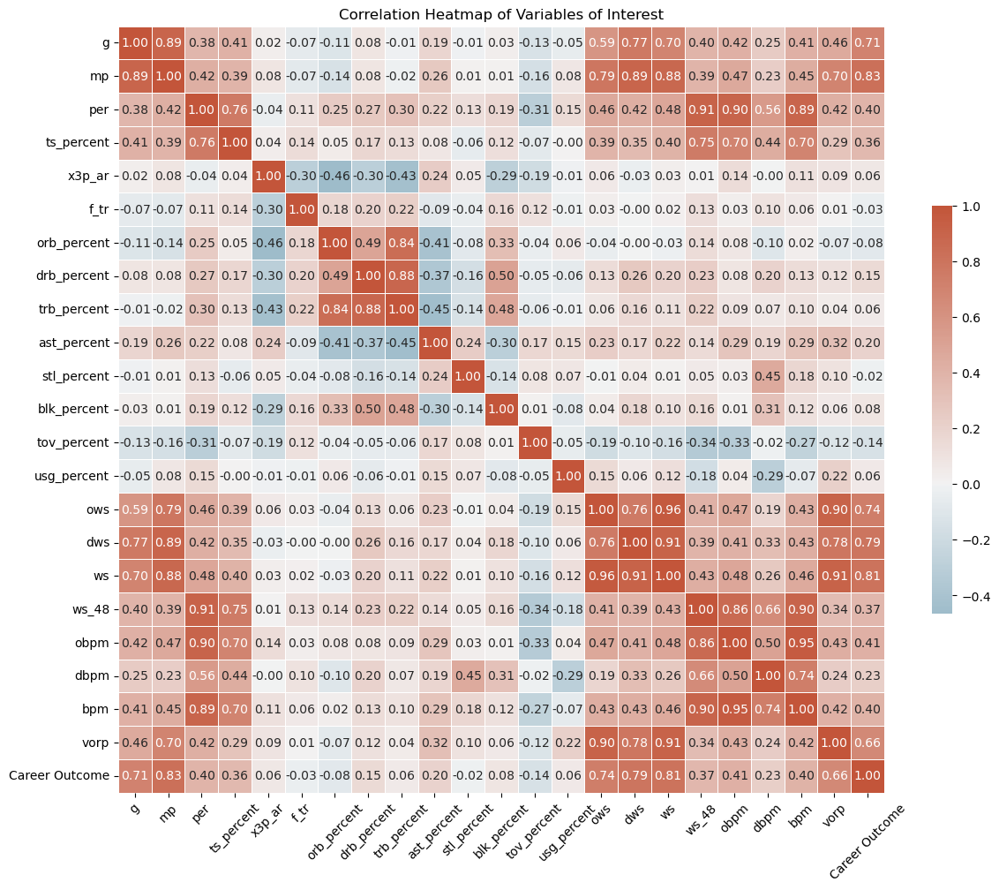

In [13]:
# Correlation plot

corr = final_dataset[variables].corr()

fig, ax = plt.subplots(figsize=(14, 12))

# Custom colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap
sns.heatmap(corr, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a title
plt.title('Correlation Heatmap of Variables of Interest')

# Show the plot
plt.show()

By looking at this correlation plot, we see there are a good amount of variables that have high correlations with each other. `vorp` and `ws` have a correlation of 0.91, `ws` has a high correlation of 0.96 and 0.91 with `ows` and `dws` respectively, `trb_percent` has correlation of 0.88 and 0.84 with `drb_percent` and `orb_percent` respectively, `g` and `mp` have a correlation of 0.89, `bpm` also has a high correlation of 0.95 and 0.74 with `obpm` and `dbpm`, `per` and `ws_48` have a correlation of 0.91, and `per` has a correlation of 0.76 with `ts_percent`. These high correlations make sense as many of these statistics are all-encompassing statistics such as `vorp`, `ws`, `per` and `bpm`. Also it is worth nothing that some variables are a combination of two other variables such as `ws` with `dws` and `ows`, and `trb_percent` with `orb_percent` and `drb_percent` which explains the high correlation. Lastly, it makes sense that `g` and `mp` have high correlations because if you play more games, it is expected that you should have more minutes played and vice-versa. Based on this analysis, I'll remove the variables: `mp`, `per`, `orb_percent`, `drb_percent`, `ows`, `dws`, `ws_48`, `obpm`, `dbpm` and `vorp`.

In [14]:
predictors = ['g', 'ts_percent', 'x3p_ar', 'f_tr',
              'trb_percent', 'ast_percent', 'stl_percent',
              'blk_percent', 'tov_percent', 'usg_percent',
              'ws', 'bpm', 'Career Outcome']

df = final_dataset.set_index(['player_id', 'player'])[predictors]

# Re-encoding career outcomes
career_outcome_re_encode = {
    4 : 'Elite',
    3 : 'All Star',
    2 : 'Starter',
    1 : 'Roster',
    0 : 'Out of League'
}

df['Career Outcome'] = df['Career Outcome'].replace(career_outcome_re_encode)

df.head(5)

,,g,ts_percent,x3p_ar,f_tr,trb_percent,ast_percent,stl_percent,blk_percent,tov_percent,usg_percent,ws,bpm,Career Outcome
player_id,player,,,,,,,,,,,,,
1845,Abdul Jeelani,71.5,0.5390,0.006500,0.4305,11.65,10.400000,1.700000,1.700000,14.55,24.050000,2.700000,0.150000,Out of League
1846,Allen Leavell,70.0,0.5119,0.119300,0.3096,3.86,27.360000,2.540000,0.420000,17.45,19.020000,2.980000,-0.220000,Starter
1847,Arvid Kramer,8.0,0.3500,0.000000,0.0910,13.90,9.300000,0.000000,6.000000,17.90,24.300000,-0.100000,-5.400000,Out of League
1848,Bernard Toone,23.0,0.4020,0.109000,0.1560,14.50,13.800000,1.500000,2.200000,19.00,27.200000,-0.100000,-5.400000,Out of League
1849,Bill Cartwright,64.2,0.5622,0.000133,0.5356,12.84,7.893333,0.846667,1.306667,16.56,18.353333,4.853333,-1.393333,All Star


Now we will be working with 12 predictors and I have indexed the player identification variables `player_id` and `player`.

Lets take a look at these predictors.

## Predictor analysis 

**Distribution of Predictors**

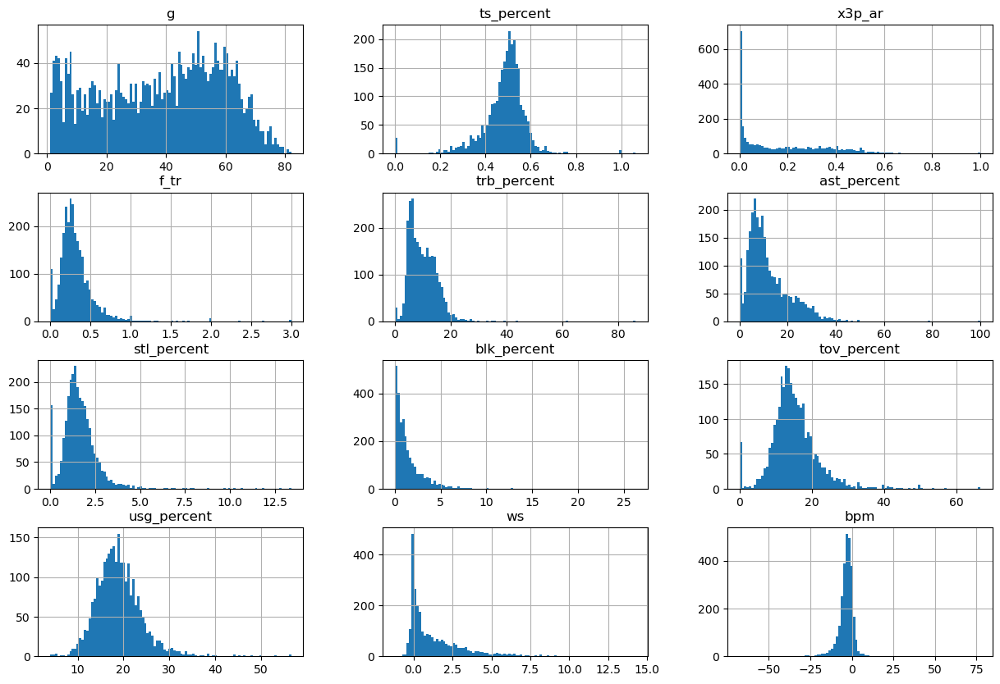

In [15]:
from matplotlib import pyplot

df.hist(figsize = (15,10), bins = 100)
pyplot.show()

Looking at the distributions of each predictor, excluding `g` we see that most of our predictors seem to have some right skewness which can indicate that there are players with outlier statistics in our data and `ts_percent` being the only other predictor that has a left-skewness. However for the most part, the distributions each predictor except for `g` seems normally distributed for the most part. Now we should take an in-depth look at each predictor individually.

Lets start with the boxplot for player games played.

**Games Played:**

In [16]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = 'g:Q',
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average games played by carrer outcome'
)

alt.Chart(...)

Looking at these boxplots it seems that typically players in higher levels of career outcome tend to play more games and the variation in games played by career outcome tends to get larger as carrer outcome levels get lower. As we see with the boxplot for Out of League, players in this level generally play at an average of around 9 to 35 games however some outlier players end up playing up to an average of around 82 games!

Now we should take a look at the boxplots for the rest of our predictors.

**True Shooting Percentage:**

In [17]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('ts_percent:Q', scale = alt.Scale(type = 'pow')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average true shooting percentage by carrer outcome'
)

alt.Chart(...)

Looking at the boxplots of true shooting percentage, there appears to be a slight increase in the percentage as the level of career outcome increases whichh goes to show that true shooting percentage would be a good predictor for career outcome. However it is worth noting that there is a large amount of variation in true shooting percentage among players that are Out of League, along with a good amount of outliers as well. There also appears to be a decent amount of outliers among the Starter players as well, and none for Elite players.


*Note that `ts_percent` (true shooting percentage) can have values higher than 1.0 since the calcuation takes in 3 point shots and and-1 as percentages higher than 100%*

**Percentage of FG attempts from 3:**

In [18]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('x3p_ar:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average percentage of FG attempts from 3 by carrer outcome'
)

alt.Chart(...)

For FG attempts from 3 point range, there doesn't appear to be any trends among career outcomes, which can be explained from the fact that the amount of players that regularly shoot from 3 point range varies between Elite, All Star, and Starter players. However just like true shooting percentage, there seems to be a large amount of outliers for out of league in comparison to the other career outcomes. In fact, Out of League is the only career outcome level that has outliers!

**Free Throw Rate:**

In [19]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('f_tr:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of free throw rate by carrer outcome'
)

alt.Chart(...)

These plots show no apparent trend in player's free throw rates, however it seems like elite level players tend to have a higher median level and 3rd quartile than the rest of the career outcomes which can indicate that elite level players tend to be better at drawing fouls and making their free throw attempts. There are outliers among all career outcomes with Out of League having most.

**Total Rebound Percentage:**

In [20]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('trb_percent:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,  
    height=500,
    title = 'Boxplot of average total rebound percentage by carrer outcome'
)

alt.Chart(...)

For total rebound percentage, we see across carrer outcomes there doesn't seem to be any trends, with all boxplots ranging between the 5.8 to 15 percent range. However we see that the 3rd quartile for Elite players is the highest out of the rest which can also tell us that there is a higher proportion of players with a better total rebound percentage than players in other career outcomes. Also as we have seen so far, there is a large amount of outliers for Out of League.

**Assist Percentage:**

In [21]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('ast_percent:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700, 
    height=500,
    title = 'Boxplot of average assist percentage by carrer outcome'
)

alt.Chart(...)

For assist percentage, there is a trend showing us that higher career outcome players tend to have higher assist percentages, with the elite level players having a 3rd quartile reaching 25.7%. With Out of League having a good amount of players with an outlier assist percentage.

**Block Percentage:**

In [22]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('blk_percent:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average block percentage by carrer outcome'
) 

alt.Chart(...)

There seems to be a small trend for block percentages among career outcome with elite level having a larger proportion of players have higher block percentages than the rest of players in different career outcomes. Starter seems to have a decent amount of outliers not too far behind Out of League.

**Steal Percentage:**

In [23]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('stl_percent:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average steal percentage by carrer outcome'
)

alt.Chart(...)

Steal percentages across career outcomes seem to be pretty even at around the 1 to 2 percent range, with Out of League having a large amount of outliers.

**Turnover Percentage:**

In [24]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('tov_percent:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700, 
    height=500,
    title = 'Boxplot of average turnover percentage by carrer outcome'
)

alt.Chart(...)

For turnover percentage, there seems to be a small trend that is opposite to what we have been seeing. With turnover percentages increasing as the level of carrer outcomes gets lower, which is expected as better players tend to turnover the ball less. Again, a large amount of outliers for Out of League.

**Usage Percentage:**

In [25]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = 'usg_percent:Q',
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average usage percentage by carrer outcome'
)

alt.Chart(...)

Usage seems to generally increase as the level of career outcome gets higher, with there being some outliers among the lower end for elite which can tell us that there are some elite level players that have a lower usage percent than the majority of elite level players. Out of League has a large amount of outliers.

**Win Share:**

In [26]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = 'ws:Q',
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average player win shares by carrer outcome'
)

alt.Chart(...)

There is a significant difference in the win shares across carrer outcome, telling us that players that have higher win shares will tend to have a higher level career outcome. With elite level players having win shares ranging around 5.1 to 8.2, all star players having win shares around 3.4 to 5.4, starters 1.2 to 2.7, roster, 0.28 to 1.0, and out of league -0.05 to 0.3. There are outliers across all career outcomes with out of league having the most.

**Box Plus-Minus:**

In [27]:
alt.Chart(df.reset_index().reset_index()).mark_boxplot().encode(
    x = alt.X('bpm:Q', scale = alt.Scale(type = 'sqrt')),
    y = alt.Y('Career Outcome:N', sort = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League']),
    color = 'Career Outcome:N'
).properties(
    width=700,
    height=500,
    title = 'Boxplot of average box plus-minus by carrer outcome'
)

alt.Chart(...)

Lastly for box plus-minus, there is an increasing trend as we go up to higher levels of career outcome. The variation in bpm values across elite, starter, roster, and out of league appears to be small for the most part with all star having a variation. All carrer outcomes have outliers with out of league having signficantly more.

Looking at these scatterplots, we see that generally for games played, true shooting percentage, assist percentage, block percentage, usage percentage, win shares, defensive box plus-minus, and box plus-minus there is a slight increase in the values these variables as the level of career outcome gets higher. While for the predictors games played, true shotting percentage, win share, and box plus-minus, the increases seem to be more significant. Looking at turnover percentage things are the opposite, with values getting smaller the higher career outcome is, which is understandable. It is also worthing that across all predictors there is a greater amount of variation and number of outliers for Out of League players in comparison to the rest of the career outcomes, which is expected as some of these variables can contain high leverage statistics for Out of League players. As for example, supposed a player that has played only one game where they shot only once and made that shot, therefore they would have a high true shooting percentage.



Lets look at the distribution of our response variable `Career Outcome`.

## Distribution of Career Outcome

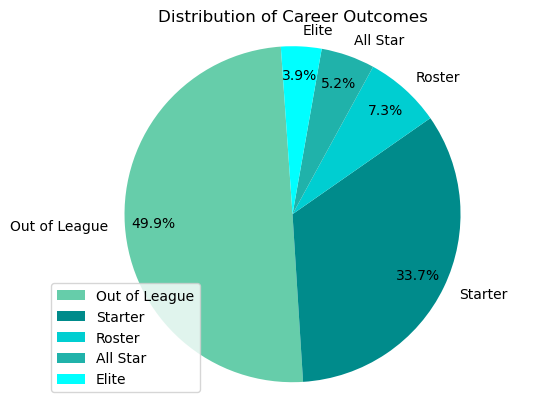

In [28]:
# Finding the counts of career outcomes and creating a pie chart of the counts
counts = df['Career Outcome'].value_counts()
labels = ['Out of League', 'Starter', 'Roster', 'All Star', 'Elite']
colors = ['mediumaquamarine', 'darkcyan', 'darkturquoise', 'lightseagreen', 'cyan']

plt.pie(counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=94, pctdistance=0.83)
plt.legend(labels)
plt.axis('equal')
plt.title('Distribution of Career Outcomes')
plt.show()

It appears that nearly half of the players in our data set are Out of League and Elite containing the smallest proportion of players in the data set. Therefore, I should take a stratified sampling approach during the modelling process.

<img src='https://media.tenor.com/1EWb9d-a80cAAAAd/iverson-crossover.gif' />

# Model Building and Selection

**Data Splitting**

For this project I am using a 80/20 split for the data and will have the split stratified on our response variable so that there is an equal distribution of `Career Outcome` for both splits. For the training process of all of the models, I will be utilizing a strafified k-fold cross validation method which is when the training data will be split into a certain number of subsets, where each subset would contain the same percentage of each class of the response variable. Then all of these subsets except for one would be used for training the model with the left out subset being used for evaluation.

In [183]:
from sklearn.model_selection import train_test_split

# Encoding our response variable
df['Career Outcome Encoded'] = df['Career Outcome']

career_outcome_encode = {
    'Elite' : 4,
    'All Star' : 3,
    'Starter' : 2,
    'Roster' : 1,
    'Out of League' : 0
}
df['Career Outcome Encoded'] = df['Career Outcome Encoded'].replace(career_outcome_encode)

y = df["Career Outcome"].values
df_x = df.drop(columns = ["Career Outcome", "Career Outcome Encoded"], axis = 1)
x = df_x.values

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, stratify = y, random_state = 222)

## Logistic Regression

Since we know that there is an unequal distribution of our response variable `Career Outcome`, we will take a stratified k fold cross validation approach combined with hyperparameter tuning.

**Hyperparameters:**
- `C`: A regularization parameter that controls the magnitude of regularization in the algorithm to avoid overfitting with C being the inverse of the regularization magnitude. Therefore, a lower value of C will mean that there is a large amount of regularization meaning more emphasis on avoiding overfitting. While a higher value of C would allow the model to better fit the training data which can lead to over fitting.

- `penalty`: The penalty parameter in logistic regression allows you to choose between L1 (Lasso), L2 (Ridge), and elasticnet (both Lasso and Ridge) regularization, and control the strength of the regularization.

- `solver`: the algorithms ('newton-cg', 'sag', 'saga', 'lbfgs') that are used in the optimization problem of our model.

- `max_iter`: the maximum amount of iterations for the solvers to converge.

*Note that since we are doing hyperparameter tuning, certain hyperparameter combinations for the logistic model won't allow it to converge. Hence, some warning messages may be outputted.*

In [184]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import roc_auc_score, accuracy_score

# Stratified kfold cross validation resampling with 5 splits
strat_kfold = StratifiedKFold(n_splits = 10, random_state = 222, shuffle = True)

roc_scores = []
acc_scores = []
models = []

for train_index, test_index in strat_kfold.split(x_train, y_train):

    x_train_kfold, x_test_kfold = x_train[train_index], x_train[test_index]
    y_train_kfold, y_test_kfold = y_train[train_index], y_train[test_index]

    log_reg = LogisticRegression(random_state = 222)

    # Grid parameters for tuning
    param_grid = [
        {"penalty" : ['l1', 'l2', 'elasticnet'],
        "C" : np.logspace(-2, 5, 10),
        "solver" : ['newton-cg', 'sag', 'saga', 'lbfgs'],
        "max_iter" : [100, 1000]
        }
    ]

    # Grid search
    grid_search_logistic = GridSearchCV(log_reg,
                                        param_grid = param_grid, 
                                        cv = 5, verbose = 1, 
                                        n_jobs = -1)

    # Fitting values
    grid_search_logistic.fit(x_train_kfold, y_train_kfold)

    # Generating predictions
    y_pred = grid_search_logistic.best_estimator_.predict(x_test_kfold)

    # Storing ROC scores
    roc = roc_auc_score(y_test_kfold, grid_search_logistic.predict_proba(x_test_kfold), multi_class= 'ovr')
    roc_scores.append(roc)
            
    # Storing accuracy scores
    acc = accuracy_score(y_test_kfold, y_pred)
    acc_scores.append(acc)

    # Storing models
    models.append(grid_search_logistic.best_estimator_)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


/Users/terry/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  n_iter_i = _check_optimize_result(
/Users/terry/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  n_iter_i = _check_optimize_result(


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits


Now that we have ran and selected the best models from logistic regression with cross validation, lets compare them to see which one has the best performance.

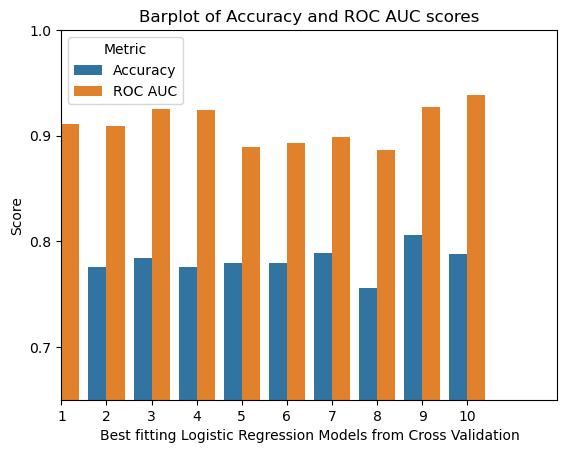

<Figure size 1000x800 with 0 Axes>

,Model,Accuracy,ROC AUC,Model Number
0,"LogisticRegression(C=100000.0, max_iter=1000, ...",0.770642,0.910904,1
1,"LogisticRegression(C=464.1588833612782, random...",0.775229,0.909235,2
2,"LogisticRegression(C=16681.005372000593, max_i...",0.784404,0.925377,3
3,"LogisticRegression(C=77.4263682681127, max_ite...",0.775229,0.924730,4
4,"LogisticRegression(C=464.1588833612782, random...",0.779817,0.889708,5
5,"LogisticRegression(C=464.1588833612782, max_it...",0.779817,0.893520,6
6,"LogisticRegression(C=77.4263682681127, random_...",0.788991,0.899249,7
7,"LogisticRegression(C=2782.559402207126, max_it...",0.755760,0.886423,8
8,"LogisticRegression(C=77.4263682681127, max_ite...",0.806452,0.927082,9
9,"LogisticRegression(C=12.91549665014884, random...",0.788018,0.938866,10


In [185]:
log_reg_models_df = pd.DataFrame({
    'Model' : models,
    'Accuracy' : acc_scores,
    'ROC AUC' : roc_scores,
    'Model Number' : np.arange(1, len(models)+1)
})

log_reg_models_melted_df = pd.melt(log_reg_models_df, id_vars=['Model', 'Model Number'],
                                   value_vars=['Accuracy', 'ROC AUC'], var_name= 'Metric', value_name = 'Score')

plt.title('Barplot of Accuracy and ROC AUC scores')
sns.barplot(x = 'Model Number', y = 'Score', hue = 'Metric', data = log_reg_models_melted_df.reset_index())
plt.xlabel('Best fitting Logistic Regression Models from Cross Validation')
plt.ylabel('Score')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axis([0, 11, 0.65, 1])
plt.figure(figsize=(10, 8))

plt.show()
log_reg_models_df

We see that the ninth model has the highest accuracy score of 0.806452 while the tenth model has the highest ROC AUC score of 0.938866. However since ROC AUC is a metric that captures more information on the models than accuracy does, I'll select the tenth model as our best model from logistic regression.

In [96]:
# Storing the metrics of the model
best_log_model_metrics = log_reg_models_df[log_reg_models_df['Model Number'] == 10].loc[:,['Accuracy', 'ROC AUC']].copy()

best_log_model = models[9]
best_log_model

LogisticRegression(C=12.91549665014884, random_state=222, solver='newton-cg')

Our best from logisitic regression has the hyperparameters of `C = 12.91549665014884` and `solver = 'newton-cg'`

## Random Forest Classifier

We will also use stratified kfold cross validation along with hyperparameter tuning for our random forest model.

**Hyperparameters:**

- `n_estimators`: The number of decision trees that are built in the random forest model.

- `max_features`: The maximum number of features that are used for a node split process.

- `max_depth`: The maximum depth of each decision tree.

- `min_samples_split` : The minimum number of samples required to split a node.

- `min_samples_leaf` : The minimum number of samples that are required to be in a leaf node of a decision tree.

- `bootstrap`: The method for sampling the data. Setting it to True will mean that the trees are trained on a subset of the data instead of the entire data set.

In [97]:
from sklearn.ensemble import RandomForestClassifier

acc_scores_rfc = []
roc_scores_rfc = []
models_rfc = []


for train_index, test_index in strat_kfold.split(x_train, y_train):
    x_train_kfold, x_test_kfold = x_train[train_index], x_train[test_index]
    y_train_kfold, y_test_kfold = y_train[train_index], y_train[test_index]

    rfc = RandomForestClassifier(random_state = 222)


    # Grid parameters for tuning
    param_grid_rfc = [
        {"n_estimators" : [int(x) for x in np.linspace(10, 100, 10)],
         "max_features" : ['log2', 'sqrt'],
         "max_depth" : [2,4],
         "min_samples_split" : [5, 10, 15],
         "min_samples_leaf" : [2, 4, 8],
         "bootstrap" : [True, False]
        }
    ]

    # Grid search
    grid_search_rfc = GridSearchCV(rfc,
                                   param_grid = param_grid_rfc, 
                                   cv = 5, 
                                   verbose = 1, 
                                   n_jobs = -1)

    # Fitting values
    grid_search_rfc.fit(x_train_kfold, y_train_kfold)

    # Generating predictions
    y_pred = grid_search_rfc.best_estimator_.predict(x_test_kfold)

    # Storing ROC scores
    roc = roc_auc_score(y_test_kfold, grid_search_rfc.predict_proba(x_test_kfold), multi_class= 'ovr')
    roc_scores_rfc.append(roc)
    
    # Storing accuracy scores
    acc = accuracy_score(y_test_kfold, y_pred)
    acc_scores_rfc.append(acc)

    # Storing models
    models_rfc.append(grid_search_rfc.best_estimator_)

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Fitting 5 folds for each of 720 candidates, totalling 3600 fits


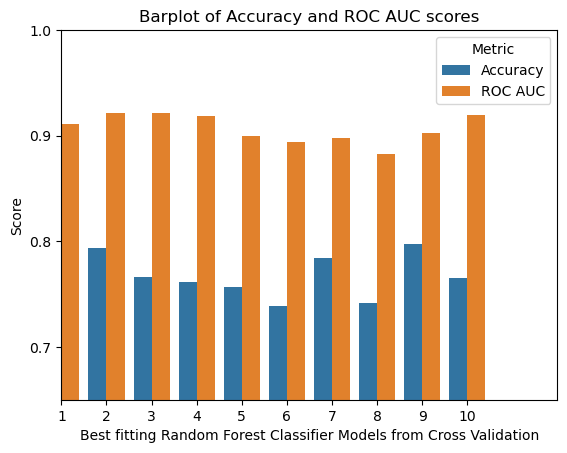

<Figure size 1000x800 with 0 Axes>

,Model,Accuracy,ROC AUC,Model Number
0,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.752294,0.911395,1
1,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.793578,0.921100,2
2,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.766055,0.921889,3
3,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.761468,0.918473,4
4,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.756881,0.899640,5
5,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.738532,0.894424,6
6,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.784404,0.897898,7
7,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.741935,0.882626,8
8,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.797235,0.902482,9
9,"(DecisionTreeClassifier(max_depth=4, max_featu...",0.764977,0.919197,10


In [98]:
rfc_models_df = pd.DataFrame({
    'Model' : models_rfc,
    'Accuracy' : acc_scores_rfc,
    'ROC AUC' : roc_scores_rfc,
    'Model Number' : np.arange(1, len(models)+1)
})

rfc_models_melted_df = pd.melt(rfc_models_df, id_vars=['Model', 'Model Number'],
                                   value_vars=['Accuracy', 'ROC AUC'], var_name= 'Metric', value_name = 'Score')

plt.title('Barplot of Accuracy and ROC AUC scores')
sns.barplot(x = 'Model Number', y = 'Score', hue = 'Metric', data = rfc_models_melted_df.reset_index())
plt.xlabel('Best fitting Random Forest Classifier Models from Cross Validation')
plt.ylabel('Score')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axis([0, 11, 0.65, 1])
plt.figure(figsize=(10, 8))

plt.show()
rfc_models_df

Looking the graph and accuracy/ROC AUC scores of each of these models, we see that models 2 and 3 seem to have the highest ROC AUC values around 0.921. Since these values are so close to each other, I'll look at the accuracy of these two models and see that model 2 has an accuracy value of 0.793578 while model 3 has an accuracy value of 0.766055. Therefore, I'll choose model 2 as the best random forest classifier model.

In [101]:
# Storing the metrics of the model
best_rfc_model_metrics = rfc_models_df[rfc_models_df['Model Number'] == 2].loc[:,['Accuracy', 'ROC AUC']].copy()

best_rfc_model = models_rfc[1]
best_rfc_model

RandomForestClassifier(bootstrap=False, max_depth=4, max_features='log2',
                       min_samples_leaf=4, min_samples_split=15,
                       n_estimators=50, random_state=222)

Our best performing randomn forest classifier model from k fold cross validation has the hyperparameters `bootstrap = False`, `max_depth = 4`, `max_features = 'log2'`, `min_samples_leaf = 4`, `min_samples_split = 15`, and `n_estimators = 50`

## Gradient Boosting Tree Classifier

**Hyperparameters:**

- `n_estimators`: The number of boosting stages to perform. 

- `max_features`: The number of features that the model considers when looking for the best fit.

- `max_depth`: Maximum depth of the individual regression estimators. The maximum depth limits the number of nodes in the tree.

- `learning_rate` : A value that represents the magnitude that the model shrinks the contribution of each tree by.

- `subsample` : The fraction of samples to be used for fitting the individual base learners.

In [102]:
from sklearn.ensemble import GradientBoostingClassifier

acc_scores_gbc = []
roc_scores_gbc = []
models_gbc = []

for train_index, test_index in strat_kfold.split(x_train, y_train):
    x_train_kfold, x_test_kfold = x_train[train_index], x_train[test_index]
    y_train_kfold, y_test_kfold = y_train[train_index], y_train[test_index]

    gbc = GradientBoostingClassifier(random_state = 222)


    # Grid parameters for tuning
    param_grid_gbc = [
        {"n_estimators" : [int(x) for x in np.linspace(10, 100, 10)],
         "learning_rate" : [0.1, 0.2, 0.3],
         "subsample" : [0.5, 1],
         "max_features" : ['log2', 'sqrt'],
         "max_depth" : [2,4]
        }
    ]

    # Grid search
    grid_search_gbc = GridSearchCV(gbc,
                                   param_grid = param_grid_gbc, 
                                   cv = 5, 
                                   verbose = 1, 
                                   n_jobs = -1)

    # Fitting values
    grid_search_gbc.fit(x_train_kfold, y_train_kfold)

    # Generating predictions
    y_pred = grid_search_gbc.best_estimator_.predict(x_test_kfold)

    # Storing ROC scores
    roc = roc_auc_score(y_test_kfold, grid_search_gbc.predict_proba(x_test_kfold), multi_class= 'ovr')
    roc_scores_gbc.append(roc)
    
    # Storing accuracy scores
    acc = accuracy_score(y_test_kfold, y_pred)
    acc_scores_gbc.append(acc)

    # Storing models
    models_gbc.append(grid_search_gbc.best_estimator_)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Fitting 5 folds for each of 240 candidates, totalling 1200 fits


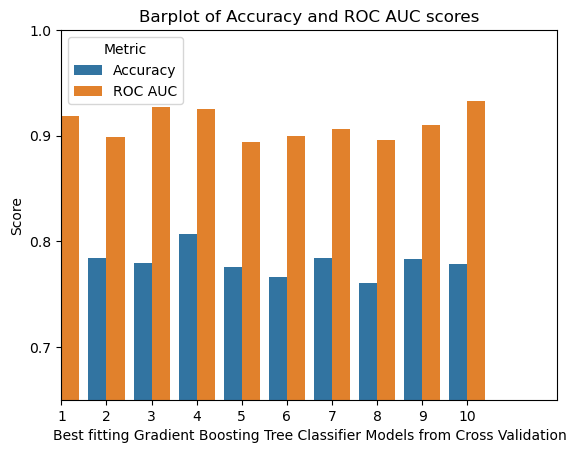

<Figure size 1000x800 with 0 Axes>

,Model,Accuracy,ROC AUC,Model Number
0,([DecisionTreeRegressor(criterion='friedman_ms...,0.775229,0.918636,1
1,([DecisionTreeRegressor(criterion='friedman_ms...,0.784404,0.899002,2
2,([DecisionTreeRegressor(criterion='friedman_ms...,0.779817,0.926868,3
3,([DecisionTreeRegressor(criterion='friedman_ms...,0.807339,0.925379,4
4,([DecisionTreeRegressor(criterion='friedman_ms...,0.775229,0.893691,5
5,([DecisionTreeRegressor(criterion='friedman_ms...,0.766055,0.899505,6
6,([DecisionTreeRegressor(criterion='friedman_ms...,0.784404,0.905893,7
7,([DecisionTreeRegressor(criterion='friedman_ms...,0.760369,0.895752,8
8,([DecisionTreeRegressor(criterion='friedman_ms...,0.783410,0.910239,9
9,([DecisionTreeRegressor(criterion='friedman_ms...,0.778802,0.933325,10


In [103]:
gbc_models_df = pd.DataFrame({
    'Model' : models_gbc,
    'Accuracy' : acc_scores_gbc,
    'ROC AUC' : roc_scores_gbc,
    'Model Number' : np.arange(1, len(models)+1)
})

gbc_models_melted_df = pd.melt(gbc_models_df, id_vars=['Model', 'Model Number'],
                                   value_vars=['Accuracy', 'ROC AUC'], var_name= 'Metric', value_name = 'Score')

plt.title('Barplot of Accuracy and ROC AUC scores')
sns.barplot(x = 'Model Number', y = 'Score', hue = 'Metric', data = gbc_models_melted_df.reset_index())
plt.xlabel('Best fitting Gradient Boosting Tree Classifier Models from Cross Validation')
plt.ylabel('Score')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axis([0, 11, 0.65, 1])
plt.figure(figsize=(10, 8))

plt.show()
gbc_models_df

Looking at the graph of accuracy and ROC AUC scores for the Gradient Boosting Tree Classifier model, we see that the tenth model has the highest ROC AUC score in comparison to the rest of the models with a score of 0.933325. Therefore, we will select this model.

In [106]:
# Storing the metrics of the model
best_gbc_model_metrics = gbc_models_df[gbc_models_df['Model Number'] == 10].loc[:,['Accuracy', 'ROC AUC']].copy()

best_gbc_model = models_gbc[9]
best_gbc_model

GradientBoostingClassifier(max_depth=2, max_features='log2', n_estimators=60,
                           random_state=222, subsample=1)

This model has the hyperparameters of `max_depth = 2`, `max_features = 'log2'`, `n_estimators = 60`, and `subsample = 1`

## K Nearest Neighbor Classifer Model

**Hyperparameters:**

- `n_neighbors`: The number of neighbors to use.

- `weights`: The weight function to be used in prediction.

- `algorithm`: The algorithm that is used to calculate the nearest neighbors.

- `leaf_size`: Deals with BallTree or KDTree algorithms which can affect the speed of the construction and query, as well as the memory required to store the tree.


In [107]:
from sklearn.neighbors import KNeighborsClassifier

acc_scores_knn = []
roc_scores_knn = []
models_knn = []

for train_index, test_index in strat_kfold.split(x_train, y_train):
    x_train_kfold, x_test_kfold = x_train[train_index], x_train[test_index]
    y_train_kfold, y_test_kfold = y_train[train_index], y_train[test_index]

    knn = KNeighborsClassifier()


    # Grid parameters for tuning
    param_grid_knn = [
        {"n_neighbors" : range(1, 30, 2),
         "weights" : ['uniform', 'distance'],
         "algorithm" : ['auto', 'ball_tree', 'kd_tree', 'brute'],
         "leaf_size" : range(1, 50, 5)
        }
    ]

    # Grid search
    grid_search_knn = GridSearchCV(knn,
                                   param_grid = param_grid_knn, 
                                   cv = 5, 
                                   n_jobs = -1)

    # Fitting values
    grid_search_knn.fit(x_train_kfold, y_train_kfold)

    # Generating predictions
    y_pred = grid_search_knn.best_estimator_.predict(x_test_kfold)

    # Storing ROC scores
    roc = roc_auc_score(y_test_kfold, grid_search_knn.predict_proba(x_test_kfold), multi_class= 'ovr')
    roc_scores_knn.append(roc)
    
    # Storing accuracy scores
    acc = accuracy_score(y_test_kfold, y_pred)
    acc_scores_knn.append(acc)

    # Storing models
    models_knn.append(grid_search_knn.best_estimator_)

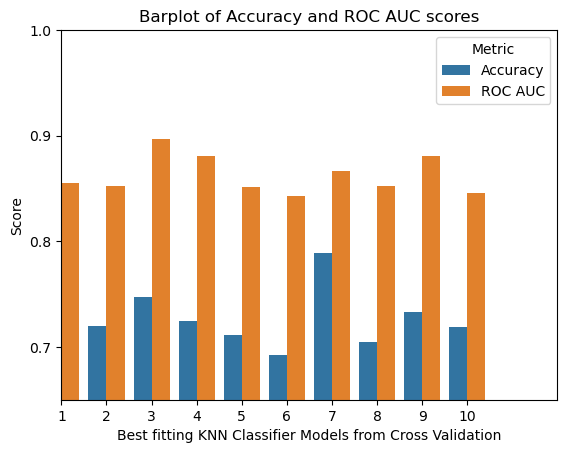

<Figure size 1000x800 with 0 Axes>

,Model,Accuracy,ROC AUC,Model Number
0,"KNeighborsClassifier(leaf_size=1, n_neighbors=...",0.697248,0.854823,1
1,"KNeighborsClassifier(leaf_size=1, n_neighbors=13)",0.720183,0.852153,2
2,"KNeighborsClassifier(leaf_size=1, n_neighbors=...",0.747706,0.897347,3
3,"KNeighborsClassifier(leaf_size=1, n_neighbors=13)",0.724771,0.880338,4
4,"KNeighborsClassifier(leaf_size=1, n_neighbors=...",0.711009,0.851196,5
5,"KNeighborsClassifier(leaf_size=1, n_neighbors=...",0.692661,0.842740,6
6,"KNeighborsClassifier(leaf_size=1, n_neighbors=...",0.788991,0.866747,7
7,"KNeighborsClassifier(leaf_size=1, n_neighbors=...",0.705069,0.852269,8
8,"KNeighborsClassifier(leaf_size=1, n_neighbors=13)",0.732719,0.880811,9
9,"KNeighborsClassifier(leaf_size=1, n_neighbors=...",0.718894,0.845782,10


In [108]:
knn_models_df = pd.DataFrame({
    'Model' : models_knn,
    'Accuracy' : acc_scores_knn,
    'ROC AUC' : roc_scores_knn,
    'Model Number' : np.arange(1, len(models)+1)
})

knn_models_melted_df = pd.melt(knn_models_df, id_vars=['Model', 'Model Number'],
                                   value_vars=['Accuracy', 'ROC AUC'], var_name= 'Metric', value_name = 'Score')

plt.title('Barplot of Accuracy and ROC AUC scores')
sns.barplot(x = 'Model Number', y = 'Score', hue = 'Metric', data = knn_models_melted_df.reset_index())
plt.xlabel('Best fitting KNN Classifier Models from Cross Validation')
plt.ylabel('Score')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axis([0, 11, 0.65, 1])
plt.figure(figsize=(10, 8))

plt.show()
knn_models_df

Looking at the KNN model we see that model 3 has the best performance with a ROC AUC score of 0.897347 which is pretty distinguished in comparison to the other KNN models. Therefore we will select model 3.

In [109]:
# Storing the metrics of the model
best_knn_model_metrics = knn_models_df[knn_models_df['Model Number'] == 3].loc[:,['Accuracy', 'ROC AUC']].copy()

best_knn_model = models_knn[2]
best_knn_model

KNeighborsClassifier(leaf_size=1, n_neighbors=17, weights='distance')

Our best performing K Nearest Neighbor Classifier model has the parameters `leaf_size = 1`, `n_neighbors = 17`, and `weights = 'distance'`.

Now that we have finished up creating our models and selecting the best hyperparameters for each model, lets take a look at which model has the best performance.

## Selecting from our models

Lets first take a look at each model and their hyperparameters together.

In [110]:
# Models with the best selected hyperparameters
best_models = [best_log_model, best_rfc_model, best_gbc_model, best_knn_model]
best_models

[LogisticRegression(C=12.91549665014884, random_state=222, solver='newton-cg'),
 RandomForestClassifier(bootstrap=False, max_depth=4, max_features='log2',
                        min_samples_leaf=4, min_samples_split=15,
                        n_estimators=50, random_state=222),
 GradientBoostingClassifier(max_depth=2, max_features='log2', n_estimators=60,
                            random_state=222, subsample=1),
 KNeighborsClassifier(leaf_size=1, n_neighbors=17, weights='distance')]

Now lets take a look at the metrics of each model. I'll create a data frame containing the metrics and plot the ROC AUC values of each model.

In [187]:
best_models_metrics = pd.concat([best_log_model_metrics, best_rfc_model_metrics, best_gbc_model_metrics, best_knn_model_metrics])
best_models_metrics['Model'] = ['Logisitic', 'Random Forest', 'Gradient Boosting', 'K Nearest Neighbors']

best_models_metrics

,Accuracy,ROC AUC,Model
9,0.788018,0.938866,Logisitic
1,0.793578,0.921100,Random Forest
9,0.778802,0.933325,Gradient Boosting
2,0.747706,0.897347,K Nearest Neighbors


In [113]:
alt.Chart(data = best_models_metrics.reset_index()).mark_bar().encode(
    x = alt.X('Model'),
    y = alt.Y('ROC AUC')
).properties(
    width = 700,
    title = "ROC AUC values of our best models"
)

alt.Chart(...)

It seems like our logistic model has the best performance with a ROC AUC value of 0.938866, with our Gradient Boosting model coming in second place with an ROC AUC value of 0.933325! While the knn model having the worst performance out of our four models.


<img src="https://firstsportz.com/wp-content/uploads/2023/08/featured-40-1140x815.jpeg" alt="Alternative text" />

# Testing Out Selected Models

Based on our analysis from the previous section, will using our Logisitic and Gradient Boosting models for fitting our testing data as they are the top two best performing models.

## Logistic Model

Lets fit our logistic model on our all of our training data with the best selected hyperparameters.

In [139]:
log_final = LogisticRegression(C=12.91549665014884, random_state=222, solver='newton-cg')

log_final.fit(x_train, y_train)

LogisticRegression(C=12.91549665014884, random_state=222, solver='newton-cg')

In [151]:
log_pred = log_final.predict(x_test)

print("Accuracy Score:", accuracy_score(y_test, log_pred))
print("ROC AUC Score:", roc_auc_score(y_test, best_models[0].predict_proba(x_test), multi_class = 'ovr'))


Accuracy Score: 0.7669724770642202
ROC AUC Score: 0.9060667268119922


The accuracy and ROC AUC scores of this model on our testing data are very good values with accuracy scores over 0.7 being good for machine learning and ROC AUC scores over 0.9 being outstanding. Therefore, having both scores over these values means that our model is very good!

**Confusion Matrix of the Logistic Model**

Text(0.5, 1.0, 'Confusion Matrix of our Logistic Model on testing data')

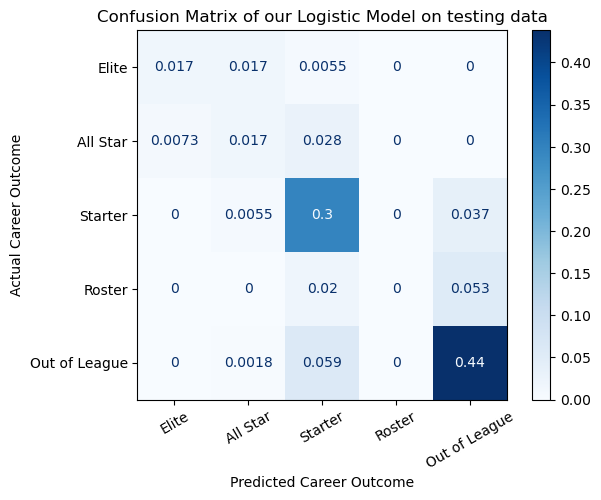

In [150]:
from sklearn.metrics import ConfusionMatrixDisplay

log_cm = ConfusionMatrixDisplay.from_predictions(y_test, log_pred,
                                                 labels = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League'],
                                                 cmap = plt.cm.Blues,
                                                 normalize = 'all',
                                                 xticks_rotation = 30
                                                 )

log_cm.ax_.set_xlabel('Predicted Career Outcome')
log_cm.ax_.set_ylabel('Actual Career Outcome')
log_cm.ax_.set_title('Confusion Matrix of our Logistic Model on testing data')

Looking at the confusion matrix of our logistic model it seems like the model is able to correctly predict the career outcomes of players for the most part. Being able to correctly predict 44% career outcomes of players in the Out of League level, 30% starter level players, 1.7% all star players, and 1.7% elite players.

## Gradient Boosting Model

Lets fit our gradient boosting model on our all of our training data with the best selected hyperparameters.

In [135]:
gb_final = GradientBoostingClassifier(max_depth=2, max_features='log2', n_estimators=60,
                            random_state=222, subsample=1)

gb_final.fit(x_train, y_train)


GradientBoostingClassifier(max_depth=2, max_features='log2', n_estimators=60,
                           random_state=222, subsample=1)

In [149]:
gb_pred = gb_final.predict(x_test)

print("Accuracy Score:", accuracy_score(y_test, gb_pred))
print("ROC AUC Score:", roc_auc_score(y_test, best_models[2].predict_proba(x_test), multi_class = 'ovr'))

Accuracy Score: 0.7577981651376147
ROC AUC Score: 0.916077774310485


Again, both the scores of this model are considered very good for machine learning!

**Confusion Matrix for the Logistic Model**

Text(0.5, 1.0, 'Confusion Matrix of our Gradient Boosting Model on testing data')

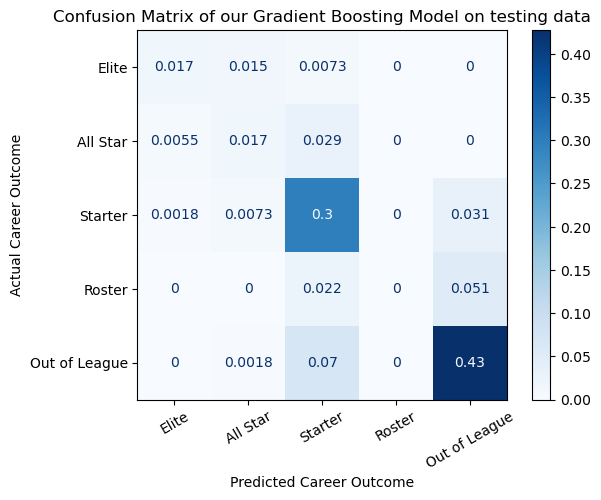

In [137]:

gb_cm = ConfusionMatrixDisplay.from_predictions(y_test, gb_pred,
                                                 labels = ['Elite', 'All Star', 'Starter', 'Roster', 'Out of League'],
                                                 cmap = plt.cm.Blues,
                                                 normalize = 'all',
                                                 xticks_rotation = 30
                                                 )

gb_cm.ax_.set_xlabel('Predicted Career Outcome')
gb_cm.ax_.set_ylabel('Actual Career Outcome')
gb_cm.ax_.set_title('Confusion Matrix of our Gradient Boosting Model on testing data')



Looking at the confusion matrix of our gradient boosting model it seems like the model is able to correctly predict the career outcomes of players for the most part. Being able to correctly predict 43% career outcomes of players in the Out of League level, 30% starter level players, 1.7% all star players, and 1.7% elite players.

# Putting Selected Models to Use

Let's try apply our model to some recently drafted players in the NBA (player's that were drafted/played their first game after 2018 and therefore, aren't in the data set used to run our models)



**Shai Gilgeous-Alexander**


<img src="https://64.media.tumblr.com/67b008fe889a7f15bccb751aa23ef457/6a414364861decae-f6/s400x600/c6d9bb1edf837d970e787e57cd5c9fb421c17314.gif" alt="Alternative text" />


In [142]:
shai = advanced4[advanced4['player'] == 'Shai Gilgeous-Alexander'].groupby(['player_id', 'player'])[df.columns[0:12]].mean()

print("Predicted Career Outcome of Shai Gilgeous-Alexander using the Logisitic Model:", best_models[0].predict(shai.values))
print("Predicted Career Outcome of Shai Gilgeous-Alexander using the Gradient Boost Model:", best_models[2].predict(shai.values))

Predicted Career Outcome of Shai Gilgeous-Alexander using the Logisitic Model: ['Elite']
Predicted Career Outcome of Shai Gilgeous-Alexander using the Gradient Boost Model: ['Elite']


**LaMelo Ball**

<img src="https://media.tenor.com/zP8vKdO5PSwAAAAd/charlotte-hornets-lamelo-ball.gif" />


In [143]:
lamelo = advanced4[advanced4['player'] == 'LaMelo Ball'].groupby(['player_id', 'player'])[df.columns[0:12]].mean()

print("Predicted Career Outcome of LaMelo Ball using the Logisitic Model:", best_models[0].predict(lamelo.values))
print("Predicted Career Outcome of LaMelo Ball using the Gradient Boost Model:", best_models[2].predict(lamelo.values))

Predicted Career Outcome of LaMelo Ball using the Logisitic Model: ['All Star']
Predicted Career Outcome of LaMelo Ball using the Gradient Boost Model: ['Starter']


**Rui Hachimura**

<img src='https://media0.giphy.com/media/KTyFBQgNGaCABPYcM8/giphy.gif?cid=ecf05e47c7zzikh27owtn04ul9riqf1em691pfpruaykph4b&ep=v1_gifs_search&rid=giphy.gif&ct=g' />

In [147]:
rui = advanced4[advanced4['player'] == 'Rui Hachimura'].groupby(['player_id', 'player'])[df.columns[0:12]].mean()

print("Predicted Career Outcome of Rui Hachimura using the Logisitic Model:", best_models[0].predict(rui.values))
print("Predicted Career Outcome of Rui Hachimura using the Gradient Boost Model:", best_models[2].predict(rui.values))

Predicted Career Outcome of Rui Hachimura using the Logisitic Model: ['Starter']
Predicted Career Outcome of Rui Hachimura using the Gradient Boost Model: ['Starter']


**Jordan Poole**

<img src='https://media.tenor.com/S06C6w2SCZgAAAAd/jordan-poole-golden-state-warriors.gif' />

In [148]:
poole = advanced4[advanced4['player'] == 'Jordan Poole'].groupby(['player_id', 'player'])[df.columns[0:12]].mean()

print("Predicted Career Outcome of Jordan Poole using the Logisitic Model:", best_models[0].predict(poole.values))
print("Predicted Career Outcome of Jordan Poole using the Gradient Boost Model:", best_models[2].predict(poole.values))

Predicted Career Outcome of Jordan Poole using the Logisitic Model: ['Starter']
Predicted Career Outcome of Jordan Poole using the Gradient Boost Model: ['Starter']


# Conclusion

Throughout this project, I aimed to predict the career outcomes of NBA players by utilizing different machine learning algorithms. After preprocessing the data, I trained models including logistic regression, random forest classification, gradient boosting classification, and k-nearest neighbors.

After evaluating each of the models using cross-validation and hyperparameter tuning, I discovered that the logisitc regression had the best performance out of all the models with an accuracy score of 0.788018 and a ROC AUC score of 0.938866 on the training data. Which proves to be pretty successful in the model's ability to predict career outcomes of NBA players.

Although the logistic regression model performed the best, it is worth noting that the gradient boosting classification model also showed some promise with scores not too far behind the logisitic regression model with an accuracy score of 0.778802 and a ROC AUC score of 0.933325. While our K-nearest neighbors model had the worst performance with the lowest accuracy and ROC AUC scores.

Therefore, I tested the performance of these specific two models on the testing data and found that the logistic model had an accuracy score of 0.766972 and ROC AUC score of 0.906066. While the gradient boosting model had an accuracy score of 0.757798 and ROC AUC score of 0.916077. In this case with the gradient boosting model had a better performance than the logistic regression model which goes to prove how close the performance of these two models are.

In general, this project demonstrated how machine learning algorithms could be used to predict how an NBA player would turn out in the future given some of their game statistics in a few seasons. However, further exploration could improve the models' performance by integrating more data such as team dynamics, player position, player playing style. Other than that, this machine learning project provided me with a great opportunity to gain some experience in machine learning and data science in general.


<img src='https://media-cldnry.s-nbcnews.com/image/upload/t_fit-880w,f_auto,q_auto:best/newscms/2016_15/1494926/ss-160413-kobe-bryant-mn-13.jpg' />